In [77]:
def plot_image(processed_image, clip_preprocesed=True):
    import matplotlib.pyplot as plt
    import numpy as np
    
    if clip_preprocesed:
        image_np = processed_image.numpy()
    else:
        image_np = processed_image

    # CLIP processor normalizes and resizes images, so we need to denormalize
    mean = np.array([0.48145466, 0.4578275, 0.40821073]).reshape(-1, 1, 1)
    std = np.array([0.26862954, 0.26130258, 0.27577711]).reshape(-1, 1, 1)

    if clip_preprocesed:
        # Denormalize
        image_np = std * image_np + mean
        # Convert from channels first to channels last
        # Clip values to [0, 1] range
        image_np = np.clip(image_np, 0, 1)
        image_np = np.transpose(image_np, (1, 2, 0))

    # Display the image
    plt.figure(figsize=(10, 10))
    plt.imshow(image_np)
    plt.axis('off')
    plt.show()
    

In [78]:
import PIL
from PIL import Image
from transformers import AutoModel

model = AutoModel.from_pretrained('jinaai/jina-clip-v2', trust_remote_code=True, device_map='mps')
truncate_dim = 512

/Users/sergeevnikita/.cache/huggingface/modules/transformers_modules/jinaai/jina-clip-implementation/51f02de9f2cf8afcd3bac4ce996859ba96f9f8e9/modeling_clip.py:137: UserWarning: Flash attention requires CUDA, disabling
  warnings.warn('Flash attention requires CUDA, disabling')
/Users/sergeevnikita/.cache/huggingface/modules/transformers_modules/jinaai/jina-clip-implementation/51f02de9f2cf8afcd3bac4ce996859ba96f9f8e9/modeling_clip.py:172: UserWarning: xFormers requires CUDA, disabling
  warnings.warn('xFormers requires CUDA, disabling')


KeyboardInterrupt: 

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


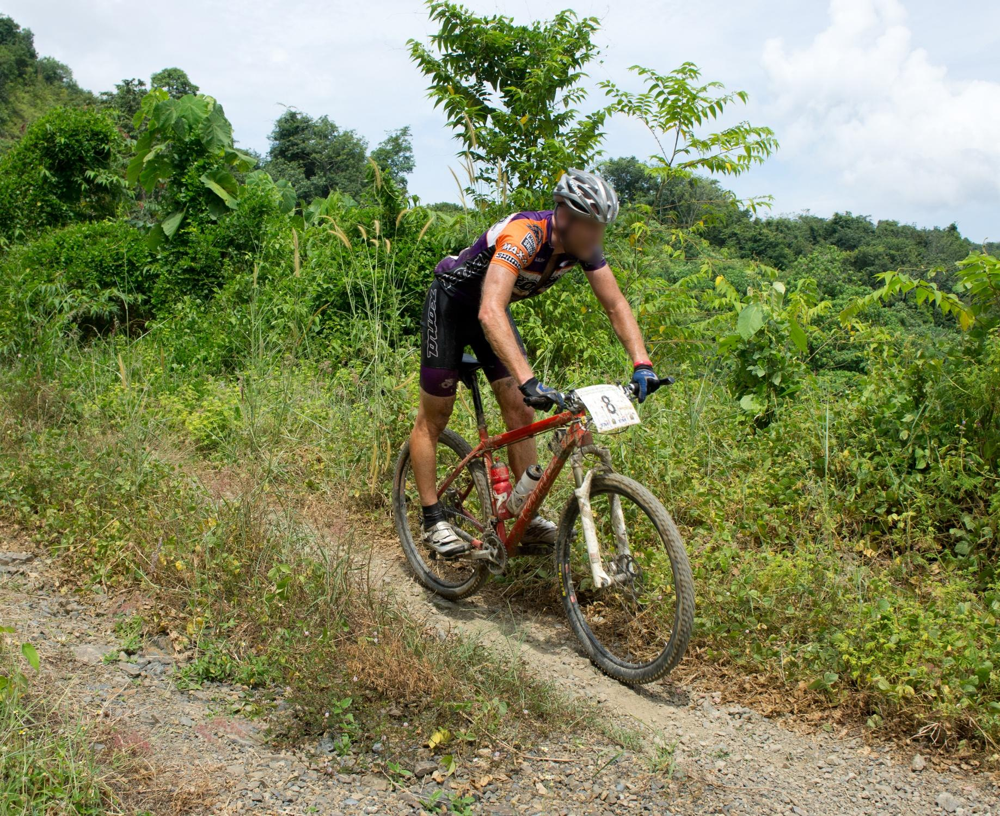

In [ ]:
image_path = "../DCI/data/densely_captioned_images/photos/sa_1554758.jpg"

image = Image.open(image_path)
image_embeddings = model.encode_image(
    image, truncate_dim=truncate_dim
)
image

In [9]:
text = "A male cyclist wearing a helmet and a racing jersey riding a mountain bike on a narrow dirt trail in a lush green forest during a mountain biking competition, numbered bib on the handlebars, surrounded by dense vegetation and hills, daytime, outdoor action shot"
text_embeddings = model.encode_text(text, truncate_dim=truncate_dim, task="retrieval.query")

In [10]:
import torch
from torch.nn import functional as F

t_tensor = torch.tensor(text_embeddings)
i_tensor = torch.tensor(image_embeddings)

sim = F.cosine_similarity(t_tensor, i_tensor, dim=-1)

t_tensor @ i_tensor, text_embeddings @ image_embeddings, sim

(tensor(0.4164), 0.41636342, tensor(0.4164))

In [11]:
from densely_captioned_images.dataset.dense_image import DenseCaptionedImage

# Load an image by its ID
dci = DenseCaptionedImage(img_id=640)  # Replace with actual image ID

# Get the image as a numpy array
image = dci.get_image()

# Get the full formatted description
full_description = dci.get_formatted_complete_description()[0]['caption']

# Alternatively, get base caption and extended caption
base_caption = dci.get_base_caption()[0]['caption']  # Short caption
extended_caption = dci.get_extended_caption()[0]['caption']  # More detailed

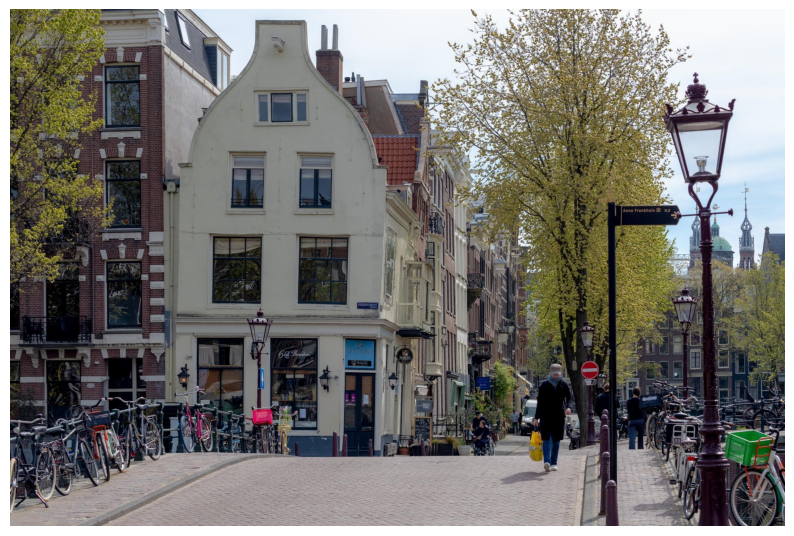

In [ ]:
plot_image(image, clip_preprocesed=False)

39
This is an image of Green basket. A medium sized green plastic basket can be seen on the front of a bike. The basket brace is orange.


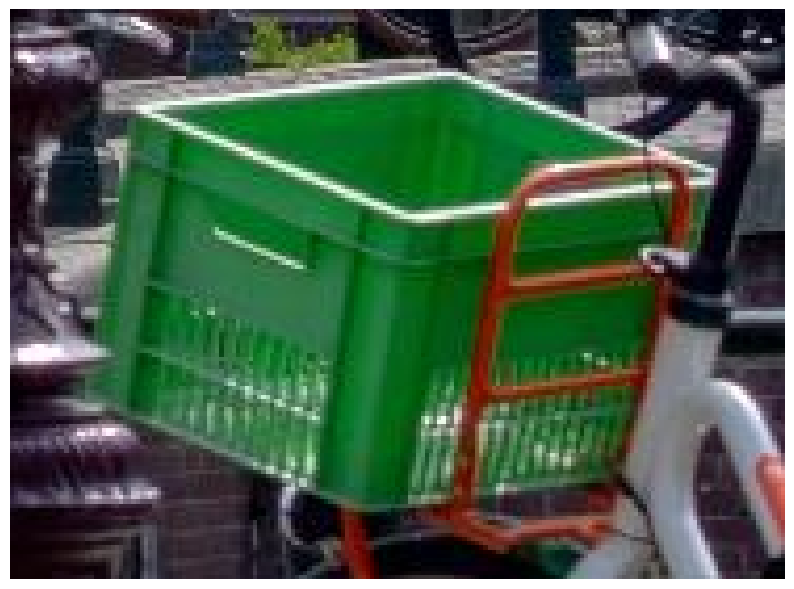

In [ ]:
all_masks = dci.get_all_masks()
print(len(all_masks))
sample = dci.get_caption_with_subcaptions(all_masks[17])

sample_image = sample[0]['image']
sample_caption = sample[0]['caption']

print(sample_caption)
plot_image(sample_image, clip_preprocesed=False)

In [ ]:
import PIL.Image


sample_image_emb = model.encode_image(
    PIL.Image.fromarray(sample_image.astype('uint8'), 'RGB'), truncate_dim=truncate_dim
)
sample_text_emb = model.encode_text(
    "photo of a man", truncate_dim=truncate_dim, task='retrieval.query'
)

sample_image_emb @ sample_text_emb

0.14047322

In [15]:
from densely_captioned_images.dataset.dense_image import get_dci_count

get_dci_count()

7805

In [ ]:
import glob
import os
import torch
from tqdm import tqdm

emb_folder = '../dense_index_v2/embeds'

img_files = sorted(glob.glob(os.path.join(emb_folder, "image_embeds_*.pt")))
query_files = sorted(glob.glob(os.path.join(emb_folder, "description_embeds_*.pt")))

queries = []
for file in query_files:
    q = torch.load(file)
    queries.append(q)


# for i in range(len(queries)):
#     for j in range(i+1, len(queries)):
#         for e in range(min(queries[i].shape[0], queries[j].shape[0])):
#             for k in range(queries[i].shape[1]):
#                 if torch.allclose(queries[i][e][k], queries[j][e][k]):
#                     try:
#                         assert torch.allclose(queries[i][e][k], torch.zeros_like(queries[i][e][k]))
#                         assert torch.allclose(queries[j][e][k], torch.zeros_like(queries[j][e][k]))
#                     except:
#                         print(e, k)

88 23
88 24
88 29
88 31
88 34
670 3
670 4
905 11
905 13
905 27
174 21
371 32
371 33
879 33
879 34
103 32
103 34
257 12
257 13
461 7
708 8
708 17
708 22
708 27
960 10
419 19
419 20
419 23
419 24
419 25
419 27
419 28
419 29
419 30
675 4
708 14
708 20
708 22
734 21
111 38
482 1
544 24
808 4
808 5
808 6
808 7
808 8
808 9
808 14
808 23
815 25
815 26
868 11
868 13
868 14
868 22
868 27
868 29
881 3
881 11
881 12
195 11
195 12
195 17
195 23
195 31
195 35
195 37
325 29
325 30
646 39
646 40
646 41
646 42
794 17
164 17
164 25
164 28
164 38


In [81]:
test_emb = "This is an image of leftmost glass pane. the glass pane along the left border."
test_emb_tensor = model.encode_text(test_emb, truncate_dim=truncate_dim, task='retrieval.query')
print(test_emb_tensor.shape)


max_sim = -1
max_sim_index = -1


queries = []
for file in query_files:
    q = torch.load(file)
    q = q.reshape(-1, 512)
    print(q.shape)
    for i in tqdm(range(q.shape[0])):
        sim = test_emb_tensor @ q[i].numpy()
        if sim > max_sim:
            max_sim = sim
            max_sim_index = i

    print(file)
    print(max_sim_index)
    print(max_sim)
    print('='*100)
    max_sim = -1
    max_sim_index = -1

(512,)
torch.Size([104000, 512])


100%|██████████| 104000/104000 [00:00<00:00, 461818.21it/s]


../dense_index_v2/embeds/description_embeds_0.pt
44311
0.8556895
torch.Size([104000, 512])


100%|██████████| 104000/104000 [00:00<00:00, 467884.32it/s]


../dense_index_v2/embeds/description_embeds_1.pt
5826
0.8074625
torch.Size([104000, 512])


100%|██████████| 104000/104000 [00:00<00:00, 461379.56it/s]


../dense_index_v2/embeds/description_embeds_2.pt
24971
0.8265276
torch.Size([104000, 512])


100%|██████████| 104000/104000 [00:00<00:00, 454004.12it/s]


../dense_index_v2/embeds/description_embeds_3.pt
55442
0.83492094
torch.Size([104000, 512])


100%|██████████| 104000/104000 [00:00<00:00, 448751.57it/s]


../dense_index_v2/embeds/description_embeds_4.pt
60039
0.7933421
torch.Size([104000, 512])


100%|██████████| 104000/104000 [00:00<00:00, 400500.22it/s]


../dense_index_v2/embeds/description_embeds_5.pt
94062
0.81846756
torch.Size([104000, 512])


100%|██████████| 104000/104000 [00:00<00:00, 450995.77it/s]


../dense_index_v2/embeds/description_embeds_6.pt
32276
0.8175806
torch.Size([83720, 512])


100%|██████████| 83720/83720 [00:00<00:00, 474376.99it/s]

../dense_index_v2/embeds/description_embeds_final.pt
63350
0.7858682


In [40]:
41513 // 104, 41513 % 104 

(399, 17)

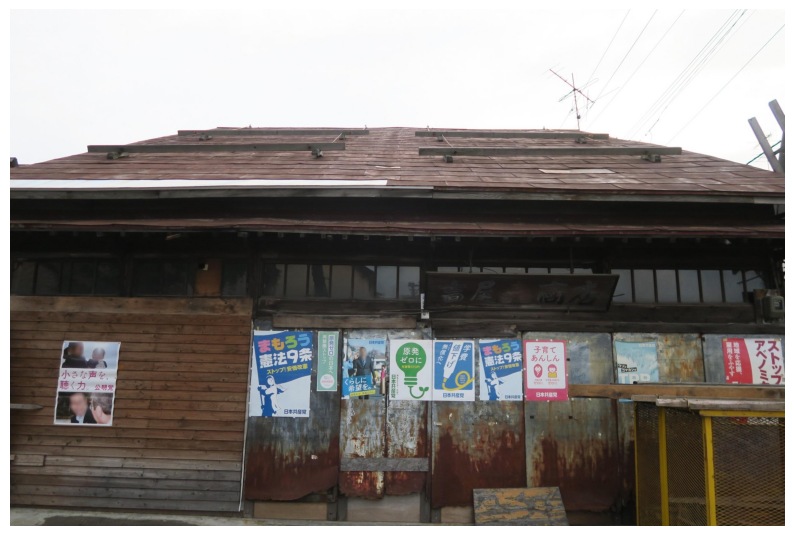

In [51]:
dci = DenseCaptionedImage(img_id=399)  # Replace with actual image ID
image = dci.get_image()
full_description = dci.get_formatted_complete_description()[0]['caption']

plot_image(image, clip_preprocesed=False)

34
This is an image of leftmost glass pane. the glass pane along the left border


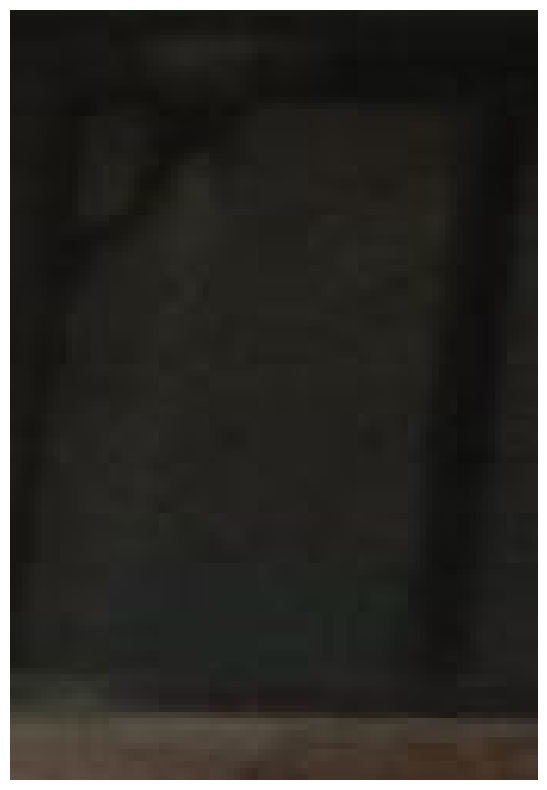

In [ ]:
all_masks = dci.get_all_masks()
print(len(all_masks))
sample = dci.get_caption_with_subcaptions(all_masks[7])

sample_image = sample[0]['image']
sample_caption = sample[0]['caption']

print(sample_caption)
plot_image(sample_image, clip_preprocesed=False)

In [60]:
sample_caption

'This is an image of leftmost glass pane. the glass pane along the left border'